# PCN on HerzCheck

Tabular heart-disease classification with the predictive-coding network.

In [ ]:
from math import ceil

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from IPython.display import HTML
from pcn.model import PredictiveCodingNetwork
from pcn.visualizer import PCN3DVisualizer
from sklearn.compose import ColumnTransformer
from sklearn.metrics import (
    ConfusionMatrixDisplay,
    accuracy_score,
    confusion_matrix,
    f1_score,
)
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from torch.utils.data import TensorDataset


In [14]:
train_df = pd.read_csv("../data/herzcheck_train.csv")


# Einfache Spaltennahmen
rename_map = {
    'Alter':'Age', 
    'Geschlecht':'Sex', 
    'Art der Brustschmerzen':'ChestPainType',
    'Ruheblutdruck':'RestingBP', 
    'Nüchternblutzucker':'FastingBS',
    'Ruhe-EKG':'RestingECG', 
    'Maximale Herzfrequenz':'MaxHR', 
    'Belastungsangina':'ExerciseAngina',
    'ST-Strecken-Senkung':'Oldpeak', 
    'Steigung der ST-Strecke':'ST_Slope',
    'Herzkrankheit (Zielvariable)':'HeartDisease'
}

train_df.rename(columns={k:v for k,v in rename_map.items() if k in train_df.columns}, inplace=True)

# Ziel und Feature-Typen setzen
TARGET = "HeartDisease"
categorical_cols = ["Sex","ChestPainType","RestingECG","ExerciseAngina","ST_Slope", "FastingBS"]
numeric_cols = ["Age","RestingBP","Cholesterin","MaxHR","Oldpeak",]

# Datentypen glätten
for c in categorical_cols:
    if c in train_df.columns:
        train_df[c] = train_df[c].astype("category")

In [15]:
test_df = pd.read_csv("../data/herzcheck_test.csv")
# Einfache Spaltennahmen
test_df.rename(columns={k:v for k,v in rename_map.items() if k in test_df.columns}, inplace=True)

# Datentypen standartisieren
for c in categorical_cols:
    if c in test_df.columns:
        test_df[c] = test_df[c].astype("category")

In [16]:
# Impute Cholesterin==0 with the mean of non-zero Cholesterin in each split
def impute_cholesterin_with_mean(df: pd.DataFrame) -> pd.DataFrame:
    """Impute Cholesterin==0 with mean of non-zero Cholesterin."""
    nonzero_mean = df.loc[df['Cholesterin'] != 0, 'Cholesterin'].mean()
    zero_mask = df['Cholesterin'] == 0
    zero_count = zero_mask.sum()
    if zero_count > 0:
        df.loc[zero_mask, 'Cholesterin'] = int(ceil(nonzero_mean))

    return df, nonzero_mean, zero_count


# Impute in Train
train_df, train_nonzero_mean, train_zero_count = impute_cholesterin_with_mean(train_df)


# Test
test_df, test_nonzero_mean, test_zero_count = impute_cholesterin_with_mean(test_df)

# Summary output
print(f"Train: replaced {train_zero_count} zeros with mean {train_nonzero_mean:.3f}")
print(f"Test : replaced {test_zero_count} zeros with mean {test_nonzero_mean:.3f}")

Train: replaced 128 zeros with mean 244.011
Test : replaced 44 zeros with mean 246.516


In [17]:

features = numeric_cols + categorical_cols
X_train = train_df[features]
y_train = train_df[TARGET]
X_test = test_df[features]
y_test = test_df[TARGET]

# Preprocessing-Pipelines
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(
        handle_unknown='ignore',
        sparse_output=False
    ))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_cols),
        ('cat', categorical_transformer, categorical_cols)
    ]
)

# 1. Pipeline auf den Trainingsdaten anpassen und Daten transformieren
X_train_transformed = preprocessor.fit_transform(X_train)
y_train_values = y_train.values

# 2. In PyTorch-Tensoren umwandeln
# (Erzwingt float32 für die Features und long für die Klassifikation, da output_dim=2)
X_tensor = torch.tensor(X_train_transformed, dtype=torch.float32)
y_tensor = torch.tensor(y_train_values, dtype=torch.long)  # torch.long wird für Klassifikations-Targets (z.B. 0 oder 1) benötigt

# 3. Train/Validation-Split aus den Trainingsdaten.
#    Die Kurve waehrend des Trainings kommt aus der Validation - der Test-Split
#    bleibt bis zur finalen Bewertung unberuehrt, sonst waehlt man Epochenzahl
#    und Hyperparameter auf den Testdaten aus.
fit_idx, val_idx = train_test_split(
    np.arange(len(y_tensor)),
    test_size=0.2,
    stratify=y_train_values,
    random_state=42,
)

# 4. Datasets. pcn.fit()/pcn.evaluate() bauen den DataLoader selbst (batch_size
#    ist dort ein Argument); ein fertiger DataLoader wird aber auch akzeptiert.
train_dataset = TensorDataset(X_tensor[fit_idx], y_tensor[fit_idx])
val_dataset = TensorDataset(X_tensor[val_idx], y_tensor[val_idx])

# 5. Test-Split mit derselben Pipeline (nur transform, kein fit).
#    Wird erst NACH dem Training angefasst.
X_test_tensor = torch.tensor(preprocessor.transform(X_test), dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.long)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

print(f"train {len(train_dataset)} | val {len(val_dataset)} | test {len(test_dataset)}")


train 550 | val 138 | test 230


In [18]:
pcn = PredictiveCodingNetwork(
    dims=[X_tensor.shape[1], 30, 20], 
    output_dim=2
)

# Beliebiger torch.optim-Optimizer. Ohne Angabe nimmt fit() SGD(lr=eta_learn,
# weight_decay=weight_decay) - das entspricht exakt der alten manuellen Regel.
# Adam geht genauso: torch.optim.Adam(pcn.parameters(), lr=1e-3)
optimizer = torch.optim.SGD(pcn.parameters(), lr=0.01, weight_decay=0.05)

history = pcn.fit(
    train_dataset,
    num_epochs=20,
    eta_infer=0.1,      # 0.01 war zu klein: die Relaxation kam nie am Fixpunkt an
    T_infer=100,
    batch_size=32,
    optimizer=optimizer,
    T_learn=1,          # >1 lernt nur mehrfach auf denselben veralteten States
    validation_data=val_dataset,   # Test bleibt bis nach dem Training aussen vor
    device="cuda",
    eval_every=5,
)


100%|██████████| 20/20 [00:08<00:00,  2.33it/s]


In [19]:
# Visualize the fully trained PCN on one held-out inference trajectory
visualizer = PCN3DVisualizer(input_mode="full", max_nodes_per_layer=80)
device = next(pcn.parameters()).device

X_test_tensor = X_test_tensor.to(device)
y_test_tensor = y_test_tensor.to(device)

In [20]:
result = pcn.run(mode="predictive", x=X_test_tensor, eta_infer=0.1, T_infer=100)
predicted_classes = result.output_prediction.argmax(dim=1)
print("Test Accuracy:", accuracy_score(y_test_tensor.cpu(), predicted_classes.cpu()))
print("Test F1 Score:", f1_score(y_test_tensor.cpu(), predicted_classes.cpu()))

Test Accuracy: 0.7043478260869566
Test F1 Score: 0.734375


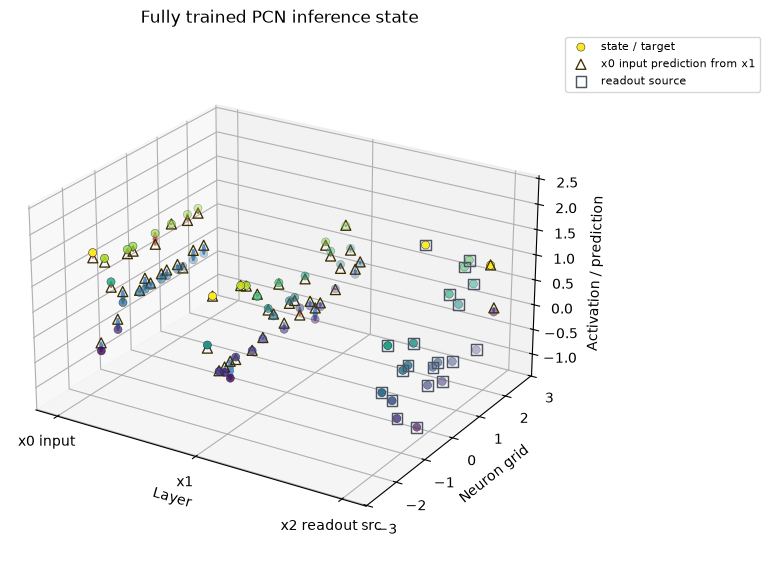

(<Figure size 1200x700 with 1 Axes>,
 <Axes3D: title={'center': 'Fully trained PCN inference state'}, xlabel='Layer', ylabel='Neuron grid', zlabel='Activation / prediction'>)

In [21]:
visualizer = PCN3DVisualizer(input_mode="full", max_nodes_per_layer=80)
device = next(pcn.parameters()).device

viz_inputs_latents, viz_frames = visualizer.run_supervised_inference(
    model=pcn,
    x=X_test_tensor,
    y=y_test_tensor,
    eta_infer=0.1,
    T_infer=100,
    device=device,
    record_every=2,
    sample_index=0,
)

visualizer.plot(viz_frames[-1], title="Fully trained PCN inference state")

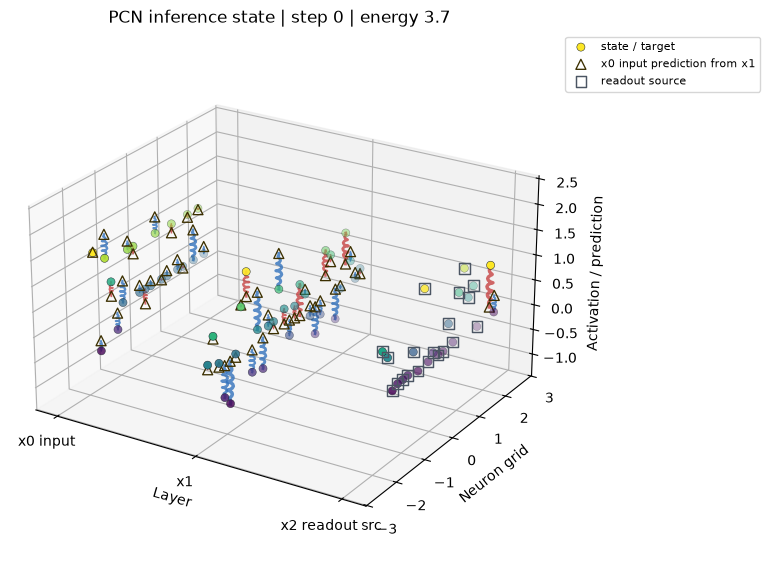

In [22]:
anim = visualizer.animate(viz_frames, interval=120, path="pcn_inference.gif")
HTML(anim.to_jshtml())

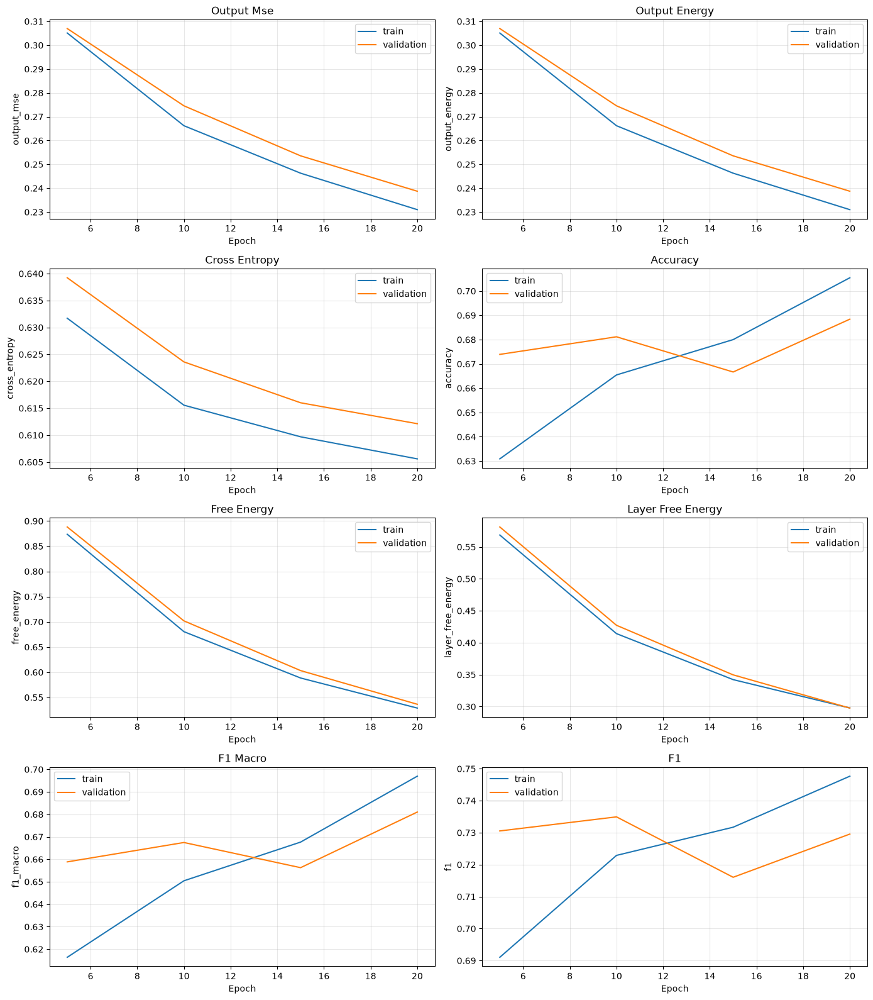

beste Validation-F1 0.7349 bei Epoche 10


In [23]:
train_hist = pd.DataFrame(history["train"], index=history["epoch"])
val_hist = pd.DataFrame(history["validation"], index=history["epoch"])

metrics = [c for c in train_hist.columns if c != "n"]
n_plots = len(metrics)
n_cols = 2
n_rows = ceil(n_plots / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 4 * n_rows))
axes = np.array(axes).ravel()

for i, metric in enumerate(metrics):
	axes[i].plot(train_hist[metric], label="train", color="tab:blue")
	if not val_hist.empty and metric in val_hist.columns:
		axes[i].plot(val_hist[metric], label="validation", color="tab:orange")
	axes[i].set_title(metric.replace("_", " ").title())
	axes[i].set_xlabel("Epoch")
	axes[i].set_ylabel(metric)
	axes[i].legend()
	axes[i].grid(True, alpha=0.3)

for j in range(i + 1, len(axes)):
	axes[j].axis("off")

plt.tight_layout()
plt.show()

# Beste Epoche nach Validation waehlen - nicht nach Test.
best = val_hist["f1"].idxmax()
print(f"beste Validation-F1 {val_hist['f1'].max():.4f} bei Epoche {best}")


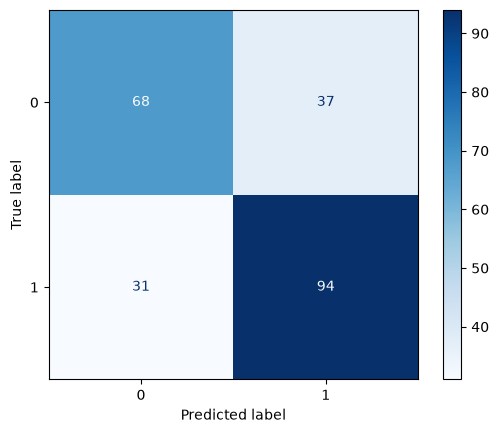

In [24]:
# Confusion Matrix
cm = confusion_matrix(y_test_tensor.cpu(), predicted_classes.cpu())
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
disp.plot(cmap=plt.cm.Blues)